<a href="https://colab.research.google.com/github/sumittagadiya/Image-super-resolution/blob/main/preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.python.data.experimental import AUTOTUNE
os.chdir('/content/drive/MyDrive/CS2')

In [3]:
!ls

blur.jpeg	   CS2_EDA.ipynb   postprocess_gaussianblur.jpg
blurred-image.png  edsr_300000.h5  preprocessing.ipynb
checkpoint	   edsr_350000.h5  test.png


# Data preparation and preprocessing

In [ ]:
class DIV2K_DATA:
    ''' This class will download data at root directory and 
    directly we can use data for training'''

    def __init__(self,
                 scale=2, # 2, 3, 4 or 8
                 subset='train', # train or validation
                 downgrade='bicubic', # 'bicubic', 'unknown', 'mild' or 'difficult'
                 images_dir='div2k/images', # image directory
                 caches_dir='div2k/caches'): # caches directory

             
        self._ntire_2018 = True  # ntire_2018 or ntire_2017

        _scales = [2, 3, 4, 8]   # scaling factors


        # scale condition
        if scale in _scales:
            self.scale = scale
        else:
            raise ValueError(f'scale value must be in ${_scales}')
        
        # subset condition 'train' or 'validation'
        if subset == 'train':
            self.image_ids = range(1, 801)
        elif subset == 'valid':
            self.image_ids = range(801, 901)
        else:
            raise ValueError("subset must be 'train' or 'valid'")

        # downgrade lists
        _downgrades_a = ['bicubic', 'unknown']
        _downgrades_b = ['mild', 'difficult']

        # NOTE : refer https://data.vision.ee.ethz.ch/cvl/DIV2K/ 

        if downgrade == 'bicubic' and scale == 8:
            # if downgrade is bicubic and scale = 8 then downgrade with x8
            # path : http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_x8.zip
            self.downgrade = 'x8'

        elif downgrade in _downgrades_b:
            # if downgrade is 'mild' or 'difficult' then downgrade respectively
            # path : http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_mild.zip
            self.downgrade = downgrade

        else:
            # if downgrade is not 'bicubic' and scale 8 or if downgrade not 'mild',
            # 'difficult' then challange is not ntire_2018.
            self.downgrade = downgrade
            self._ntire_2018 = False
        
        if scale == 8 and downgrade != 'bicubic':
            raise ValueError(f'scale 8 must have bicubic downgrade')

        if downgrade in _downgrades_b and scale != 4:
            raise ValueError(f'{downgrade} downgrade requires scale 4')

        self.subset = subset
        self.images_dir = images_dir
        self.caches_dir = caches_dir

        # create directories if not already exist
        os.makedirs(images_dir, exist_ok=True)
        os.makedirs(caches_dir, exist_ok=True)

    def __len__(self):
        ''' This function will return length of respected dataset'''
        return len(self.image_ids)


    # LR and HR images dir have paths of Low resolution and High resolution images.
    def _LR_images_dir(self):

        '''This function will return absolute path of dataset to download as per ntire_2018 
        or ntire_2017'''

        if self._ntire_2018:
            # return path as per ntire_2018 download path name
            # path : http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_x8
            return os.path.join(self.images_dir, f'DIV2K_{self.subset}_LR_{self.downgrade}')
        else:
            # return path as per ntire_2017 download path name
            # path : http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X2
            return os.path.join(self.images_dir, f'DIV2K_{self.subset}_LR_{self.downgrade}',
                                f'X{self.scale}')

    def _HR_images_dir(self):
        # path from div2k official site : 
        # http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR
        return os.path.join(self.images_dir, f'DIV2K_{self.subset}_HR')

    # LR and HR images archive function have absolute download link of zip folder

    def _LR_images_archive(self):
        ''' Low resolution images archive path'''
        if self._ntire_2018:
            # http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_x8.zip
            return f'DIV2K_{self.subset}_LR_{self.downgrade}.zip'
        else:
            # http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X2.zip
            return f'DIV2K_{self.subset}_LR_{self.downgrade}_X{self.scale}.zip'

    def _HR_images_archive(self):
        ''' High resolution image archive path'''
        # http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip
        return f'DIV2K_{self.subset}_HR.zip'
    
    # Low resolution image file funtion has LR image path because it is different 
    # in ntire_2018 and n_tire 2017 comeptition

    def _LR_image_file(self, image_id):
        ''' It returns Low resolution image path as per condition ntire_2018 or scale'''
        if not self._ntire_2018 or self.scale == 8:
            # eg. 0001x2.png, 0002x2.png, ..., 0800x2.png train LR images
            return f'{image_id:04}x{self.scale}.png'
        else:
            return f'{image_id:04}x{self.scale}{self.downgrade[0]}.png'

    # LR and HR image files function have absolute path of each LR and HR image files.

    def _LR_image_files(self):
        '''It returns Low resolution images absolute path'''
        images_dir = self._LR_images_dir()
        return [os.path.join(images_dir, 
                             self._LR_image_file(image_id)) for image_id in self.image_ids]

    def _HR_image_files(self):
        '''It returns High resolution images absolute path'''
        # eg. 0001.png, 0002.png....High Resolution Images
        images_dir = self._HR_images_dir()
        return [os.path.join(images_dir, 
                             f'{image_id:04}.png') for image_id in self.image_ids]
    
    # LR and HR cache file function have cache files of LR and HR images
    def _LR_cache_file(self):
        '''It returns cache file path of low resolution images'''
        return os.path.join(self.caches_dir, 
                            f'DIV2K_{self.subset}_LR_{self.downgrade}_X{self.scale}.cache')

    def _HR_cache_file(self):
        ''' It returns cache file path of high resolution images'''
        return os.path.join(self.caches_dir, f'DIV2K_{self.subset}_HR.cache')

    # LR and HR cache index function have index of cache files
    def _LR_cache_index(self):
        ''' It returns index of LR cache file'''
        return f'{self._LR_cache_file()}.index'

    def _HR_cache_index(self):
        ''' It returns index of HR cache file index'''
        return f'{self._HR_cache_file()}.index'


    # -----------------------------------------------------------
    #  Static methods
    # -----------------------------------------------------------
    
    @staticmethod
    def _Images_dataset(image_files):
        # this function decode png files in an efficient way
        ds = tf.data.Dataset.from_tensor_slices(image_files)
        ds = ds.map(tf.io.read_file)
        ds = ds.map(lambda x: tf.image.decode_png(x, channels=3),
                    num_parallel_calls=AUTOTUNE)
        return ds

    @staticmethod
    def _populate_cache(ds, cache_file):
        print(f'Caching decoded images in {cache_file} ...')
        for _ in ds: pass
        print(f'Cached decoded images in {cache_file}.')

    # -----------------------------------------------------------
    #  Create LR_dataset and HR_dataset
    # -----------------------------------------------------------

    def LR_dataset(self):
        ''' This function creates low resolution image dataset'''
        if not os.path.exists(self._LR_images_dir()):
            download_archive(self._LR_images_archive(), self.images_dir, extract=True)

        ds = self._Images_dataset(self._LR_image_files()).cache(self._LR_cache_file())

        if not os.path.exists(self._LR_cache_index()):
            self._populate_cache(ds, self._LR_cache_file())

        return ds

    def HR_dataset(self):
        ''' This function creates high resolution image dataset '''
        if not os.path.exists(self._HR_images_dir()):
            download_archive(self._HR_images_archive(), self.images_dir, extract=True)

        ds = self._Images_dataset(self._HR_image_files()).cache(self._HR_cache_file())

        if not os.path.exists(self._HR_cache_index()):
            self._populate_cache(ds, self._HR_cache_file())

        return ds
    
    # -----------------------------------------------------------
    #  Final Dataset
    # -----------------------------------------------------------

    def dataset(self, batch_size=16, repeat_count=None, random_transform=True):
        # take LR and HR image Symanteneously
        ds = tf.data.Dataset.zip((self.LR_dataset(), self.HR_dataset()))
        # random transform will apply only on train dataset
        if random_transform:
            # random cropping
            ds = ds.map(lambda lr, hr: random_crop(lr, hr, scale=self.scale),
                        num_parallel_calls=AUTOTUNE)
            # random rotate
            ds = ds.map(random_rotate, num_parallel_calls=AUTOTUNE)
            # random flip
            ds = ds.map(random_flip, num_parallel_calls=AUTOTUNE)
        # ds.batch() will take images in given batch size
        ds = ds.batch(batch_size)
        # it will repeat dataset. if repeat_count() = None then infinite cardinality
        ds = ds.repeat(repeat_count)
        # ds.prefetch() will prefetch data for given buffer_size
        ds = ds.prefetch(buffer_size=AUTOTUNE)
        return ds

# Download Archive function extracts High Resolution and LR Resolution images.

def download_archive(file, target_dir, extract=True):
    ''' This function extract images into cache directory '''
    source_url = f'http://data.vision.ee.ethz.ch/cvl/DIV2K/{file}'
    target_dir = os.path.abspath(target_dir)
    tf.keras.utils.get_file(file, source_url, cache_subdir=target_dir, extract=extract)
    os.remove(os.path.join(target_dir, file))

# Image augmentation like cropping, rotating, flipping

In [3]:
# -----------------------------------------------------------
#  Augmentation (crop, flip, rotate)
# -----------------------------------------------------------

def random_crop(lr_img, hr_img, hr_crop_size=96, scale=2):
    ''' This function crops lr(47x47) and hr(96x96) images'''
    lr_crop_size = hr_crop_size // scale
    lr_img_shape = tf.shape(lr_img)[:2]

    lr_width = tf.random.uniform(shape=(), maxval=lr_img_shape[1] - lr_crop_size + 1, dtype=tf.int32)
    lr_height = tf.random.uniform(shape=(), maxval=lr_img_shape[0] - lr_crop_size + 1, dtype=tf.int32)

    hr_width = lr_width * scale
    hr_height = lr_height * scale

    lr_img_cropped = lr_img[lr_height:lr_height + lr_crop_size, lr_width:lr_width + lr_crop_size]
    hr_img_cropped = hr_img[hr_height:hr_height + hr_crop_size, hr_width:hr_width + hr_crop_size]

    return lr_img_cropped, hr_img_cropped

def random_flip(lr_img, hr_img):
    ''' This function will flip imag left_right randomly'''
    random = tf.random.uniform(shape=(), maxval=1)
    return tf.cond(random < 0.5,lambda: (lr_img, hr_img),
                   lambda: (tf.image.flip_left_right(lr_img),
                            tf.image.flip_left_right(hr_img)))
        
def random_rotate(lr_img, hr_img):
    ''' This function will rotate image randomly to 90 degree'''
    rand = tf.random.uniform(shape=(), maxval=4, dtype=tf.int32)
    return tf.image.rot90(lr_img, rand), tf.image.rot90(hr_img, rand)

In [ ]:
div2k_train = DIV2K_DATA(scale=4, subset='train', downgrade='bicubic')
div2k_valid = DIV2K_DATA(scale=4, subset='valid', downgrade='bicubic')

In [ ]:
train_ds = div2k_train.dataset(batch_size=16, random_transform=True)
valid_ds = div2k_valid.dataset(batch_size=1, random_transform=False, repeat_count=1)

246915072/246914039 [==============================] - 29s 0us/step
Caching decoded images in div2k/caches/DIV2K_train_LR_bicubic_X4.cache ...
Cached decoded images in div2k/caches/DIV2K_train_LR_bicubic_X4.cache.
3530604544/3530603713 [==============================] - 406s 0us/step
Caching decoded images in div2k/caches/DIV2K_train_HR.cache ...
Cached decoded images in div2k/caches/DIV2K_train_HR.cache.
31506432/31505881 [==============================] - 3s 0us/step
Caching decoded images in div2k/caches/DIV2K_valid_LR_bicubic_X4.cache ...
Cached decoded images in div2k/caches/DIV2K_valid_LR_bicubic_X4.cache.
448995328/448993893 [==============================] - 49s 0us/step
Caching decoded images in div2k/caches/DIV2K_valid_HR.cache ...
Cached decoded images in div2k/caches/DIV2K_valid_HR.cache.


In [ ]:
train_ds = div2k_train.dataset(batch_size=16, random_transform=True)
valid_ds = div2k_valid.dataset(batch_size=1, random_transform=False, repeat_count=1)

In [ ]:
print('Number of HR Train Images = ',
      len(os.listdir('/content/drive/MyDrive/CS2/div2k/images/DIV2K_train_HR')))
print('Number of LR Train Images',
      len(os.listdir('/content/drive/MyDrive/CS2/div2k/images/DIV2K_train_LR_bicubic/X4')))
print('Number of HR Validation Images = ',
      len(os.listdir('/content/drive/MyDrive/CS2/div2k/images/DIV2K_valid_HR')))
print('Number of LR Validation Images = ',
      len(os.listdir('/content/drive/MyDrive/CS2/div2k/images/DIV2K_valid_LR_bicubic/X4')))

Number of HR Train Images =  800
Number of LR Train Images 800
Number of HR Validation Images =  100
Number of LR Validation Images =  100


In [ ]:
# train data has Infinite cardinality because of ds.repeat()
print((train_ds.cardinality() == tf.data.INFINITE_CARDINALITY).numpy())

True


In [ ]:
print('train_ds cardinality is ==> ', train_ds.cardinality().numpy())
print('valid_ds cardinality is ==> ', valid_ds.cardinality().numpy())

train_ds cardinality is ==>  -1
valid_ds cardinality is ==>  100


In [ ]:
# function to plot Low and High resolution images

def plot_images(tf_dataset,n_rows,figsize=(30,30)):
    # subplots
    fig,axes = plt.subplots(nrows =n_rows, ncols = 2, figsize=figsize)
    for ax in axes.flatten():
        ax.axis('off')
    count = -1
    for lr, hr in tf_dataset.take(n_rows).as_numpy_iterator():
        count+=1
        print('LR Shape is {} and HR shape is {}'.format(lr[0].shape,hr[0].shape))
        axes[count,0].set_title('Low resolution',fontdict={'fontsize': 20,'fontweight': 'bold'})
        axes[count,0].imshow(lr[0])
        axes[count,1].set_title('High Resolution',fontdict={'fontsize': 20,'fontweight': 'bold'})
        axes[count,1].imshow(hr[0])


LR Shape is (339, 510, 3) and HR shape is (1356, 2040, 3)
LR Shape is (339, 510, 3) and HR shape is (1356, 2040, 3)


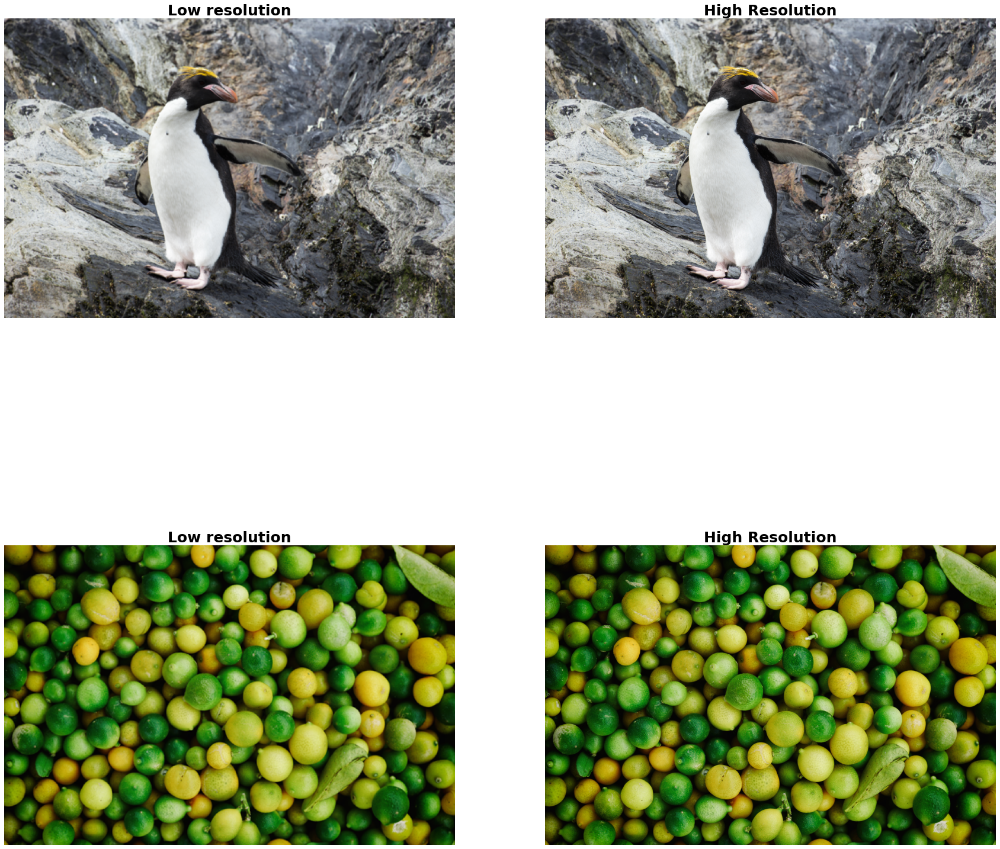

In [ ]:
# Low and High resolution validation dataset
plot_images(valid_ds,2)

LR Shape is (24, 24, 3) and HR shape is (96, 96, 3)
LR Shape is (24, 24, 3) and HR shape is (96, 96, 3)


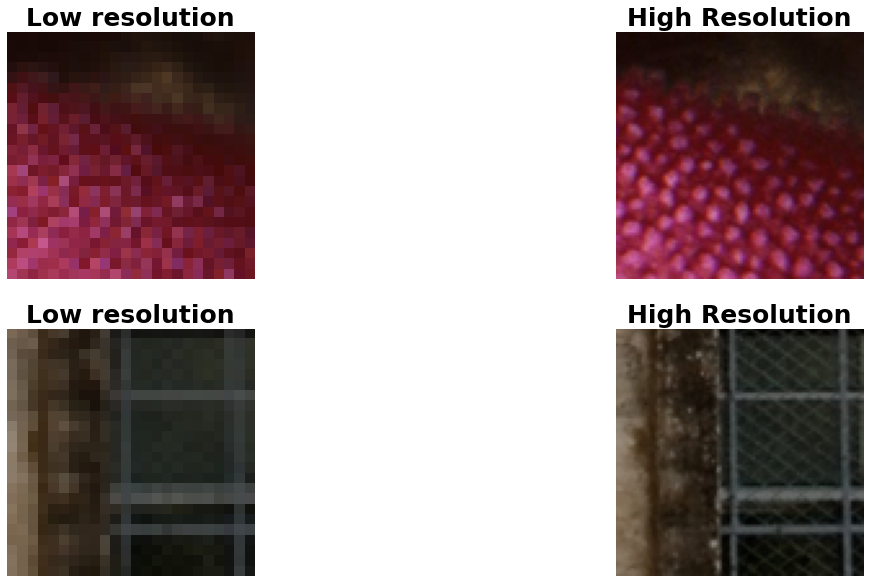

In [ ]:
# Low and High resolution images of train dataset
plot_images(train_ds,2,figsize=(20,10))

# Another method to get train and validation data using tf.tfds
* In above DIV2k class data will be download onto local machine so we can avoid downloading on local machine by using tf.tfds API

In [ ]:
div2k = tfds.image.Div2k(config='bicubic_x4')
div2k.download_and_prepare()

EXTRACTING {'train_lr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X4.zip', 'valid_lr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_LR_bicubic_X4.zip', 'train_hr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip', 'valid_hr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip'}


Shuffling and writing examples to /root/tensorflow_datasets/div2k/bicubic_x4/2.0.0.incompleteFOZ5U6/div2k-train.tfrecord


Shuffling and writing examples to /root/tensorflow_datasets/div2k/bicubic_x4/2.0.0.incompleteFOZ5U6/div2k-validation.tfrecord


Dataset div2k downloaded and prepared to /root/tensorflow_datasets/div2k/bicubic_x4/2.0.0. Subsequent calls will reuse this data.


In [ ]:
ds_train = div2k.as_dataset(split='train',as_supervised=True)
ds_valid = div2k.as_dataset(split='validation',as_supervised=True)

In [ ]:
d_train = ds_train.cache()
d_valid = ds_valid.cache()

In [ ]:
type(d_train)

tensorflow.python.data.ops.dataset_ops.CacheDataset

In [ ]:
type(ds_train)

tensorflow.python.data.ops.dataset_ops.PrefetchDataset

In [ ]:
print('Train cardinality = ',ds_train.cardinality().numpy())
print('Validation cardinality',ds_valid.cardinality().numpy())

Train cardinality =  800
Validation cardinality 100


In [ ]:
def preprocessing(data, batch_size=16,scale=4,repeat_count=None, random_transform=True):
        # random transform will apply only on train dataset
        if random_transform:
            # random cropping
            data = data.map(lambda lr, hr: random_crop(lr, hr, scale=scale),num_parallel_calls=AUTOTUNE)
            # random rotate
            data = data.map(random_rotate,num_parallel_calls=AUTOTUNE)
            # random flip
            data = data.map(random_flip,num_parallel_calls=AUTOTUNE)
        # ds.batch() will take images in given batch size
        data = data.batch(batch_size)
        # it will repeat dataset. if repeat_count() = None then infinite cardinality
        data = data.repeat(repeat_count)
        # ds.prefetch() will prefetch data for given buffer_size
        data = data.prefetch(buffer_size=AUTOTUNE)
        return data

In [ ]:
train_preprocessed = preprocessing(d_train)
valid_preprocessed = preprocessing(d_valid,batch_size=1,repeat_count=1,random_transform=False)

In [ ]:
print('Train cardinality = ',train_preprocessed.cardinality().numpy())
print('Validation cardinality',valid_preprocessed.cardinality().numpy())

Train cardinality =  -1
Validation cardinality 100


LR Shape is (24, 24, 3) and HR shape is (96, 96, 3)
LR Shape is (24, 24, 3) and HR shape is (96, 96, 3)


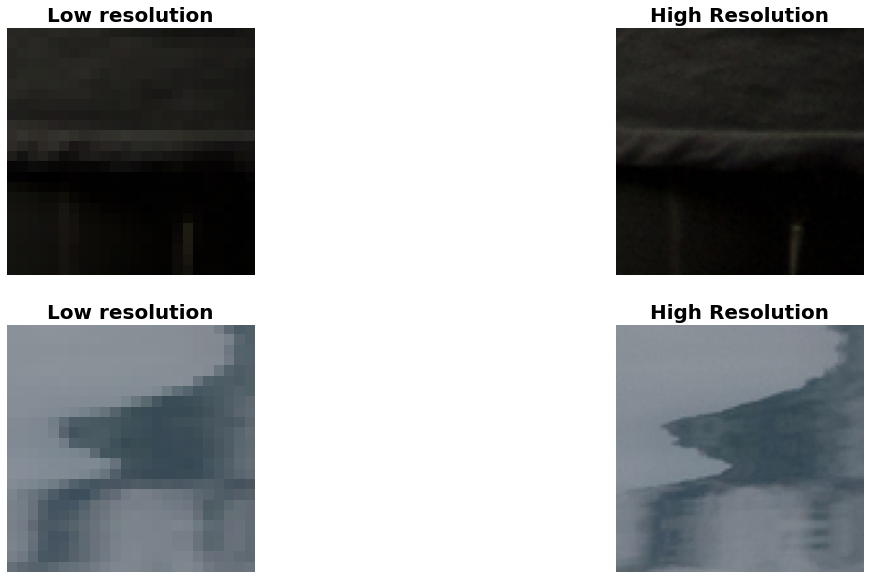

In [ ]:
plot_images(train_preprocessed,n_rows=2,figsize=(20,10))

LR Shape is (510, 417, 3) and HR shape is (2040, 1668, 3)
LR Shape is (393, 510, 3) and HR shape is (1572, 2040, 3)


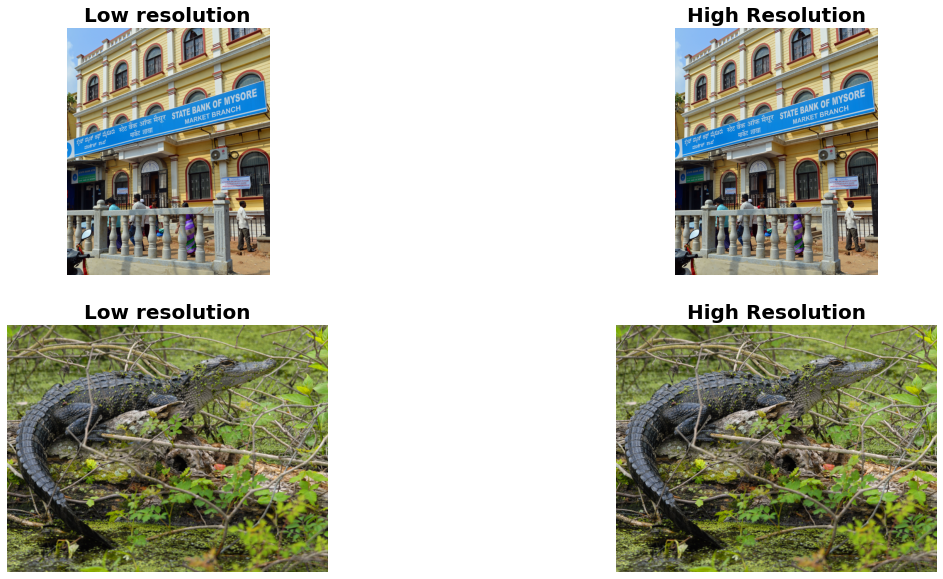

In [ ]:
plot_images(valid_preprocessed,n_rows=2,figsize=(20,10))

PSNR value ==>  29.609228
SSIM value ==>  0.92586166


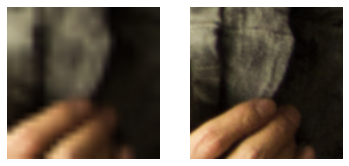

In [ ]:
fig,axes = plt.subplots(nrows =1, ncols = 2)
for ax in axes.flatten():
        ax.axis('off')
for lr,hr in train_preprocessed:
    #LR = tf.cast(lr, tf.float32)
    LR = tf.image.resize(lr, size=(512,512))
    HR = tf.image.resize(hr, size=(512,512))
    #print(LR)
    LR = tf.clip_by_value(LR, 0, 255)
    HR = tf.clip_by_value(HR, 0, 255)
    # round up values
    LR = tf.round(LR)
    HR = tf.round(HR)
    # change dtype to unint8
    LR = tf.cast(LR, tf.uint8)
    HR = tf.cast(HR, tf.uint8)
    #print(LR)
    axes[0].imshow(LR[0])
    axes[1].imshow(HR[0])
    psnr_value = tf.image.psnr(HR, LR, max_val=255).numpy()
    ssim = tf.image.ssim(HR,LR,max_val=255)
    print('PSNR value ==> ',psnr_value[0])
    print("SSIM value ==> ",ssim.numpy()[0])
    break


PSNR value ==>  24.716297
SSIM value ==>  0.8525073


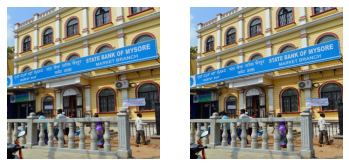

In [ ]:
fig,axes = plt.subplots(nrows =1, ncols = 2)
for ax in axes.flatten():
        ax.axis('off')
for lr,hr in valid_preprocessed :
    #LR = tf.cast(lr, tf.float32)
    LR = tf.image.resize(lr, size=(512,512))
    HR = tf.image.resize(hr, size=(512,512))
    #print(LR)
    LR = tf.clip_by_value(LR, 0, 255)
    HR = tf.clip_by_value(HR, 0, 255)
    # round up values
    LR = tf.round(LR)
    HR = tf.round(HR)
    # change dtype to unint8
    LR = tf.cast(LR, tf.uint8)
    HR = tf.cast(HR, tf.uint8)
    #print(LR)
    axes[0].imshow(LR[0])
    axes[1].imshow(HR[0])
    psnr_value = tf.image.psnr(HR, LR, max_val=255).numpy()
    ssim = tf.image.ssim(HR,LR,max_val=255)
    print('PSNR value ==> ',psnr_value[0])
    print("SSIM value ==> ",ssim.numpy()[0])
    break

# Create EDSR Model Function
* Below mentioned is Proposed Architecture of EDSR

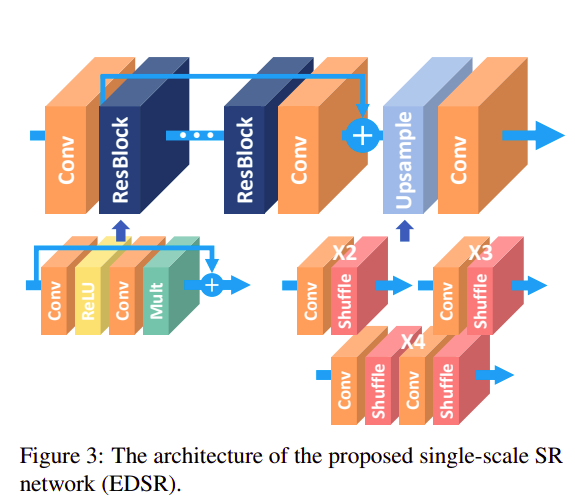



---
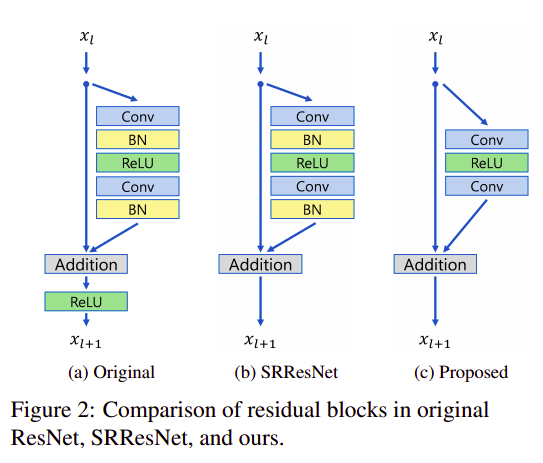


In [6]:
import numpy as np
from tensorflow.python.keras.models import Model
from tensorflow.python.keras.layers import Add, Conv2D, Input, Lambda
DIV2K_RGB_MEAN = np.array([0.4488, 0.4371, 0.4040]) * 255

In [7]:

def normalize(x,rgb_mean=DIV2K_RGB_MEAN):
    '''This function will normalize image by substracting RGB mean from image'''
    return (x - rgb_mean) / 127.5

def denormalize(x,rgb_mean=DIV2K_RGB_MEAN):
    ''' This function will denormalize image by adding back rgb_mean'''
    return (x * 127.5 )+ rgb_mean

def shuffle_pixels(scale):
    return lambda x: tf.nn.depth_to_space(x, scale)

In [8]:
def ResBlock(x_input, num_filters, scaling):
    '''Thpis function Implementes Proposed ResBlock Architecture as per EDSR paper'''
    # proposed ResBlock ==> Conv --> Relu --> Conv --> Scaling(mul) --> Add
    x = Conv2D(num_filters, 3, padding='same', activation='relu')(x_input)
    x = Conv2D(num_filters, 3, padding='same')(x)
    if scaling:
        x = Lambda(lambda t: t * scaling)(x)
    x = Add()([x_input, x])
    return x

def Upsampling(x, scale, num_filters):
    '''This function upsampling as mentioned in EDSR paper'''
    def upsample(x, factor, **kwargs):
        x = Conv2D(num_filters * (factor ** 2), 3, padding='same', **kwargs)(x)
        return Lambda(shuffle_pixels(scale=factor))(x)

    if scale == 2:
        x = upsample(x, 2, name='conv2d_1_scale_2')
    elif scale == 3:
        x = upsample(x, 3, name='conv2d_1_scale_3')
    elif scale == 4:
        x = upsample(x, 2, name='conv2d_1_scale_2')
        x = upsample(x, 2, name='conv2d_2_scale_2')

    return x


def EDSR(scale, num_filters=64, res_blocks=8, res_block_scaling=None):
    x_input = Input(shape=(None, None, 3))
    # Normalize input with DIV2K_RGB_MEAN
    x = Lambda(normalize)(x_input)
    
    # assign value of x to x_res block for further operations
    x = x_res_block = Conv2D(num_filters, 3, padding='same')(x)

    # Goes in number of res block
    for i in range(res_blocks):
        x_res_block = ResBlock(x_res_block, num_filters, res_block_scaling)
    # convolution
    x_res_block = Conv2D(num_filters, 3, padding='same')(x_res_block)
    # add res_block output and original normalizwd input
    x = Add()([x, x_res_block])

    # upsampling
    x = Upsampling(x, scale, num_filters)
    x = Conv2D(3, 3, padding='same')(x)
    
    # denormalize to get back original form
    x = Lambda(denormalize)(x)
    return Model(x_input, x, name="EDSR")


In [13]:
e = EDSR(4,res_blocks=16)

In [ ]:
e.summary()

Model: "EDSR"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
lambda (Lambda)                 (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 6 1792        lambda[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 6 36928       conv2d[0][0]                     
_______________________________________________________________________________________________

# Create Training Class

In [ ]:
from tensorflow.keras.losses import MeanAbsoluteError
from tensorflow.keras.metrics import Mean
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import PiecewiseConstantDecay
policy = tf.keras.mixed_precision.experimental.Policy('mixed_float16')
tf.keras.mixed_precision.experimental.set_policy(policy) 
import time
import os

In [ ]:
!ls

CS2_EDA.ipynb  preprocessing.ipynb


In [ ]:
#!rm -rf checkpoint

In [ ]:
os.makedirs('checkpoint/edsr/',exist_ok=True)

In [10]:
class Training_pipeline:
    def __init__(self, model, loss, learning_rate, checkpoint_directory='/checkpoint/edsr'):
        # current time
        self.start = None
        # initialize loss
        self.loss = loss
        # checkpoint initialize
        self.checkpoint = tf.train.Checkpoint(step=tf.Variable(0),
                                              psnr=tf.Variable(-1.0),
                                              ssim = tf.Variable(-1.0),
                                              optimizer=tf.keras.optimizers.Adam(learning_rate,epsilon=1e-08),
                                              model=model)
        # checkpoint manager initialize
        self.checkpoint_manager = tf.train.CheckpointManager(checkpoint=self.checkpoint,
                                                             directory=checkpoint_directory,
                                                             max_to_keep=3)
        # restore letest checkpoint
        self.restore()
        
    @property
    def model(self):
        return self.checkpoint.model

    def train_model(self, train_dataset, validation_dataset, steps, evaluate_every=1000, save_best_only=False):
        # initilize mean metric
        loss_mean = tf.keras.metrics.Mean()
        # call heckpoint manager
        checkpoint_manager = self.checkpoint_manager
        # call checkpoint
        checkpoint = self.checkpoint

        self.start = time.perf_counter()
        # Iterating through train ds
        for lr, hr in tqdm(train_dataset.take(steps - checkpoint.step.numpy())):
            # adding 1 to checkpoint step
            checkpoint.step.assign_add(1)
            # get step value
            step = checkpoint.step.numpy()
            # get loss 
            loss = self.training_step(lr, hr)
            # get mean loss
            loss_mean(loss)
            
            # evaluate at every 1000 steps
            if step % evaluate_every == 0:
                # get loss mean at every 1000 step
                loss_value = loss_mean.result()
                # reset loss mean object 
                loss_mean.reset_states()
                # Compute psnr on validation dataset
                psnr = self.get_psnr(validation_dataset)
                # Compute ssim on validaton dataset
                ssim = self.get_ssim(validation_dataset)
                # get total time duration
                duration = time.perf_counter() - self.start
                # print loss, psnr and duration
                print(f'{step}/{steps}: LOSS = {loss_value.numpy():.4f},PSNR = {psnr.numpy():3f}, SSIM = {ssim.numpy():3f},Time = ({duration:.2f}s)')

                
                if save_best_only and psnr <= checkpoint.psnr:
                    self.start = time.perf_counter()
                    # skip saving checkpoint, if psnr not improving
                    continue
                # If psnr improved then save 
                checkpoint.psnr = psnr
                # save checkpoint manager 
                checkpoint_manager.save()

                self.start = time.perf_counter()


    @tf.function
    def training_step(self, lr, hr):
        with tf.GradientTape() as tape:
            # convert dtypes
            lr = tf.cast(lr, tf.float32)
            hr = tf.cast(hr, tf.float32)

            # get sr image from trained model
            sr = self.checkpoint.model(lr, training=True)
            # get loss value 
            get_loss_value = self.loss(hr, sr)

        gradients = tape.gradient(get_loss_value, self.checkpoint.model.trainable_variables)
        self.checkpoint.optimizer.apply_gradients(zip(gradients, self.checkpoint.model.trainable_variables))

        return get_loss_value


    # evaluate (get psnr value)
    def get_psnr(self, dataset):
        psnr_values = []
        for lr, hr in dataset:
            # convert dtype to float32
            lr = tf.cast(lr, tf.float32)
            # get sr image from model
            sr = self.checkpoint.model(lr)
            # clip values to 0,255
            sr = tf.clip_by_value(sr, 0, 255)
            # round up values
            sr = tf.round(sr)
            # change dtype to unint8
            sr = tf.cast(sr, tf.uint8)
            # get psnr value
            psnr_value = tf.image.psnr(hr, sr, max_val=255)[0]
            # append psnr value
            psnr_values.append(psnr_value)
        return tf.reduce_mean(psnr_values)

    # get ssim on validation dataset
    def get_ssim(self,dataset):
        ssim_values = []
        for lr,hr in dataset:
            # convert dtype to float32
            lr = tf.cast(lr, tf.float32)
            # get sr image from model
            sr = self.checkpoint.model(lr)
            # clip values to 0,255
            sr = tf.clip_by_value(sr, 0, 255)
            # round up values
            sr = tf.round(sr)
            # change dtype to unint8
            sr = tf.cast(sr, tf.uint8)
            # get ssim value
            ssim_value = tf.image.ssim(hr, sr, max_val=255).numpy()[0]
            # append ssim value
            ssim_values.append(ssim_value)
        return tf.reduce_mean(ssim_values)

    # restore checkpoint
    def restore(self):
        if self.checkpoint_manager.latest_checkpoint:
            self.checkpoint.restore(self.checkpoint_manager.latest_checkpoint)
            print(f'Model restored from checkpoint at step {self.checkpoint.step.numpy()}.')

## EDSR Training Class

In [11]:
class EdsrTraining(Training_pipeline):
    def __init__(self, model, checkpoint_dir,
                 learning_rate = tf.keras.optimizers.schedules.PiecewiseConstantDecay(
                     boundaries=[200000],values=[1e-4, 5e-5])):
        
        super().__init__(model, 
                         loss = tf.keras.losses.MeanAbsoluteError(), 
                         learning_rate=learning_rate, 
                         checkpoint_directory=checkpoint_dir)

    def start_training(self, train_dataset, validation_dataset, steps=300000, evaluate_every=1000, save_best_only=True):
        super().train_model(train_dataset, validation_dataset, steps, evaluate_every, save_best_only)


In [ ]:
trainer = EdsrTraining(
    model=EDSR(scale=4, num_filters=64, res_blocks=16, res_block_scaling=None), 
    checkpoint_dir= f'checkpoint/edsr')

Model restored from checkpoint at step 291000.


In [ ]:
trainer.start_training(train_preprocessed,
              valid_preprocessed.take(10),
              steps=300000, 
              evaluate_every=1000, 
              save_best_only=True)

In [ ]:
trainer.restore()

Model restored from checkpoint at step 291000.


In [ ]:
# evaluate on whole validationn dataset
validation_psnr = trainer.get_psnr(valid_preprocessed)

In [ ]:
print('Validation PSNR ===> ', validation_psnr.numpy())

Validation PSNR ===>  28.829412


In [ ]:
trainer.model.save_weights('edsr_300000.h5')

In [ ]:
model = EDSR(scale=4,res_blocks=16)
model.load_weights('edsr_300000.h5')

# train for another 10000 steps

In [ ]:
class EdsrTraining(Training_pipeline):
    def __init__(self, model, checkpoint_dir,
                 learning_rate = tf.keras.optimizers.schedules.PiecewiseConstantDecay(
                     boundaries=[5000],values=[5e-5,25e-6])):
        
        super().__init__(model, 
                         loss = tf.keras.losses.MeanAbsoluteError(), 
                         learning_rate=learning_rate, 
                         checkpoint_directory=checkpoint_dir)

    def start_training(self, train_dataset, validation_dataset, steps=300000, evaluate_every=1000, save_best_only=True):
        super().train_model(train_dataset, validation_dataset, steps, evaluate_every, save_best_only)


In [ ]:
trainer = EdsrTraining(
    model=EDSR(scale=4, num_filters=64, res_blocks=16, res_block_scaling=None), 
    checkpoint_dir= f'checkpoint/edsr')

Model restored from checkpoint at step 291000.


In [ ]:
trainer.checkpoint.step.numpy()

291000

In [ ]:
trainer.start_training(train_preprocessed,
              valid_preprocessed.take(10),
              steps=300000, 
              evaluate_every=1000, 
              save_best_only=True)

292000/300000: LOSS = 6.2228,PSNR = 29.383469, SSIM = 0.850371,Time = (157.83s)
293000/300000: LOSS = 6.1327,PSNR = 29.378088, SSIM = 0.850689,Time = (31.89s)
294000/300000: LOSS = 6.2350,PSNR = 29.377604, SSIM = 0.850390,Time = (31.93s)
295000/300000: LOSS = 6.2044,PSNR = 29.383194, SSIM = 0.850917,Time = (31.87s)
296000/300000: LOSS = 6.2218,PSNR = 29.386875, SSIM = 0.850640,Time = (31.76s)
297000/300000: LOSS = 6.2647,PSNR = 29.387539, SSIM = 0.850511,Time = (31.65s)
298000/300000: LOSS = 6.1962,PSNR = 29.372707, SSIM = 0.850485,Time = (31.84s)
299000/300000: LOSS = 6.1919,PSNR = 29.389185, SSIM = 0.851043,Time = (31.59s)
300000/300000: LOSS = 6.2352,PSNR = 29.382757, SSIM = 0.851068,Time = (31.76s)



In [ ]:
trainer.restore()

Model restored from checkpoint at step 299000.


# Train for another 50,000 steps with reduced learning rate

In [21]:
class EdsrTraining(Training_pipeline):
    def __init__(self, model, checkpoint_dir,
                 learning_rate = tf.keras.optimizers.schedules.PiecewiseConstantDecay(
                     boundaries=[325000],values=[125e-7,625e-8])):
        
        super().__init__(model, 
                         loss = tf.keras.losses.MeanAbsoluteError(), 
                         learning_rate=learning_rate, 
                         checkpoint_directory=checkpoint_dir)

    def start_training(self, train_dataset, validation_dataset, steps=350000, evaluate_every=1000, save_best_only=True):
        super().train_model(train_dataset, validation_dataset, steps, evaluate_every, save_best_only)


In [ ]:
trainer = EdsrTraining(
    model=EDSR(scale=4, num_filters=64, res_blocks=16, res_block_scaling=None), 
    checkpoint_dir= f'checkpoint/edsr')

In [ ]:
trainer.start_training(train_preprocessed,
              valid_preprocessed.take(10),
              steps=350000, 
              evaluate_every=1000, 
              save_best_only=True)

300000/350000: LOSS = 6.1812,PSNR = 29.401020, SSIM = 0.851104,Time = (33.96s)
301000/350000: LOSS = 6.2027,PSNR = 29.401373, SSIM = 0.851120,Time = (31.68s)
302000/350000: LOSS = 6.1908,PSNR = 29.400309, SSIM = 0.851144,Time = (31.62s)
303000/350000: LOSS = 6.2150,PSNR = 29.402185, SSIM = 0.851131,Time = (31.56s)
304000/350000: LOSS = 6.1675,PSNR = 29.396160, SSIM = 0.850967,Time = (31.60s)
305000/350000: LOSS = 6.1917,PSNR = 29.403660, SSIM = 0.851073,Time = (31.64s)
306000/350000: LOSS = 6.1858,PSNR = 29.410862, SSIM = 0.851117,Time = (31.81s)
307000/350000: LOSS = 6.1922,PSNR = 29.417858, SSIM = 0.851410,Time = (31.63s)
308000/350000: LOSS = 6.2061,PSNR = 29.407207, SSIM = 0.851481,Time = (31.68s)
309000/350000: LOSS = 6.1501,PSNR = 29.400751, SSIM = 0.851123,Time = (31.52s)
310000/350000: LOSS = 6.1528,PSNR = 29.404367, SSIM = 0.851186,Time = (31.39s)
311000/350000: LOSS = 6.1754,PSNR = 29.403595, SSIM = 0.851259,Time = (31.29s)
312000/350000: LOSS = 6.1873,PSNR = 29.412167, SSIM 

In [ ]:
trainer.restore()

Model restored from checkpoint at step 348000.


In [ ]:
# evaluate on whole validationn dataset
validation_psnr = trainer.get_psnr(valid_preprocessed)

In [ ]:
validation_ssim = trainer.get_ssim(valid_preprocessed)

In [ ]:
print('Validation PSNR ===> ', validation_psnr.numpy())
print('Validation SSIM ===> ', validation_ssim.numpy())

Validation PSNR ===>  28.880352
Validation SSIM ===>  0.8162939


In [ ]:
# save weights
trainer.model.save_weights('edsr_350000.h5')

In [64]:
new_model = EDSR(scale=4,res_blocks=16)
new_model.load_weights('edsr_350000.h5')

#### Get super resolution image from model

In [19]:
def get_sr_image(model, lr_batch):
    if len(lr_batch.shape) == 3 :
        lr_batch = tf.expand_dims(lr_batch,axis=0)
    lr_batch = tf.cast(lr_batch, tf.float32)
    sr_batch = model(lr_batch)
    sr_batch = tf.clip_by_value(sr_batch, 0, 255)
    sr_batch = tf.round(sr_batch)
    sr_batch = tf.cast(sr_batch, tf.uint8)
    return sr_batch

#### Helper functions

In [28]:
from PIL import Image

def load_image(path):
    return np.array(Image.open(path))

def plot_custom_images(lr,sr,figsize = (20,10)):
    fig,axes = plt.subplots(nrows = 1, ncols = 2, figsize=figsize)
    for ax in axes.flatten():
        ax.axis('off')
    axes[0].set_title('Low resolution',fontdict={'fontsize': 20,'fontweight': 'bold'})
    axes[0].imshow(lr)
    axes[1].set_title('Super Resolution(predicted)',fontdict={'fontsize': 20,'fontweight': 'bold'})
    axes[1].imshow(sr)

# This function will plot LR and HR images
def plot_sample(lr, sr,figsize=(10,10)):
    plt.figure(figsize=figsize)

    images = [lr, sr]
    titles = ['LR', 'HR']

    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(1, 2, i+1)
        plt.imshow(img)
        plt.title(title)
        plt.xticks([])
        plt.yticks([])


# this function will plot 3 images named LR, SR(predicted) and HR(original)
def plot_images(lr,sr,hr,figsize=(10,10)):
    plt.figure(figsize=figsize)

    images = [lr, sr, hr]
    titles = ['LR', f'SR (x{sr.shape[0] // lr.shape[0]})(predicted)', 'HR(Original)']

    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(1, 3, i+1)
        plt.imshow(img)
        plt.title(title)
        plt.xticks([])
        plt.yticks([])

In [ ]:
test_valid = preprocessing(d_valid.take(5),batch_size=1,repeat_count=1,random_transform=True)    

## plot low resolution and super resolution images from validation dataset

PSNR = [27.352507] and SSIM = [0.74023557]
PSNR = [31.057335] and SSIM = [0.90420437]
PSNR = [30.059603] and SSIM = [0.80099994]
PSNR = [40.13571] and SSIM = [0.96183157]
PSNR = [32.04006] and SSIM = [0.80722857]


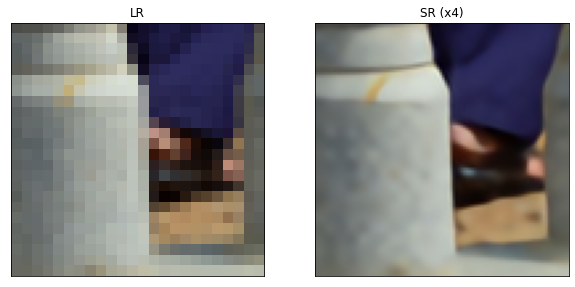

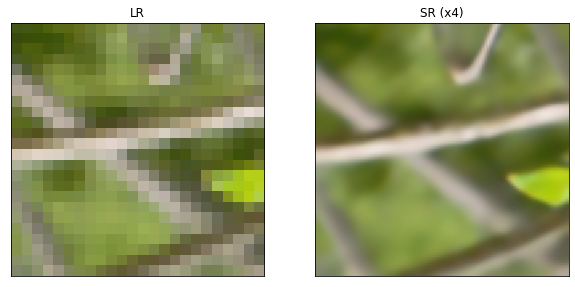

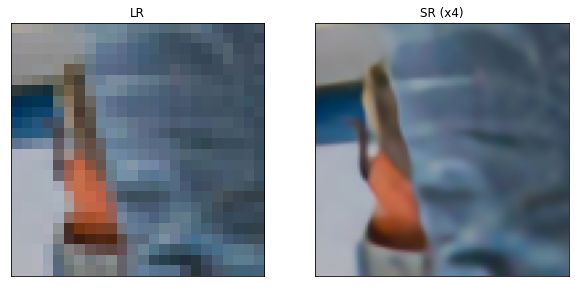

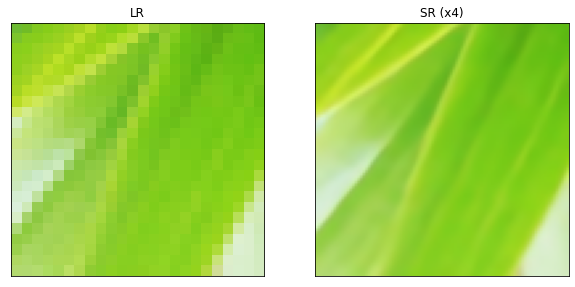

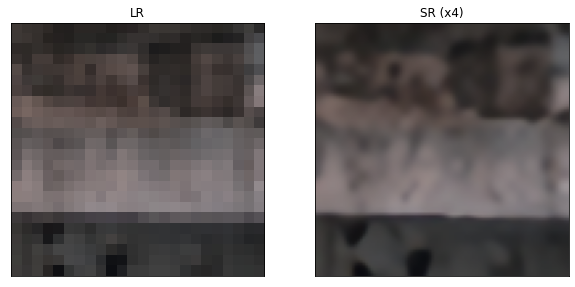

In [ ]:
for lr,hr in test_valid:
    sr = get_sr_image(new_model,lr)
    psnr = tf.image.psnr(hr,sr,max_val=255).numpy()
    ssim = tf.image.ssim(hr,sr,max_val=255).numpy()
    print('PSNR = {} and SSIM = {}'.format(psnr,ssim))
    plot_sample(lr[0],sr[0])

PSNR = [30.9611] and SSIM = [0.9107397]
PSNR = [27.584797] and SSIM = [0.79919845]
PSNR = [25.887138] and SSIM = [0.8049579]
PSNR = [43.01377] and SSIM = [0.97338206]
PSNR = [29.22186] and SSIM = [0.7331922]


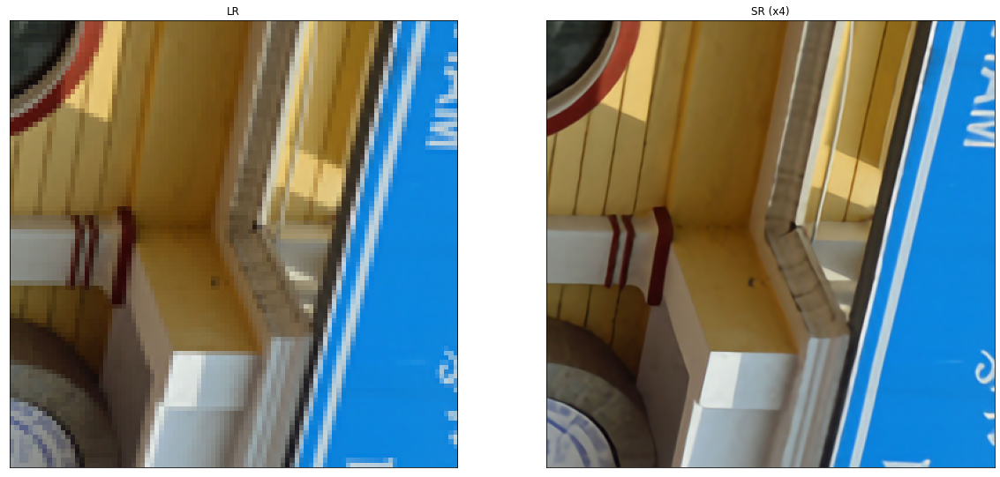

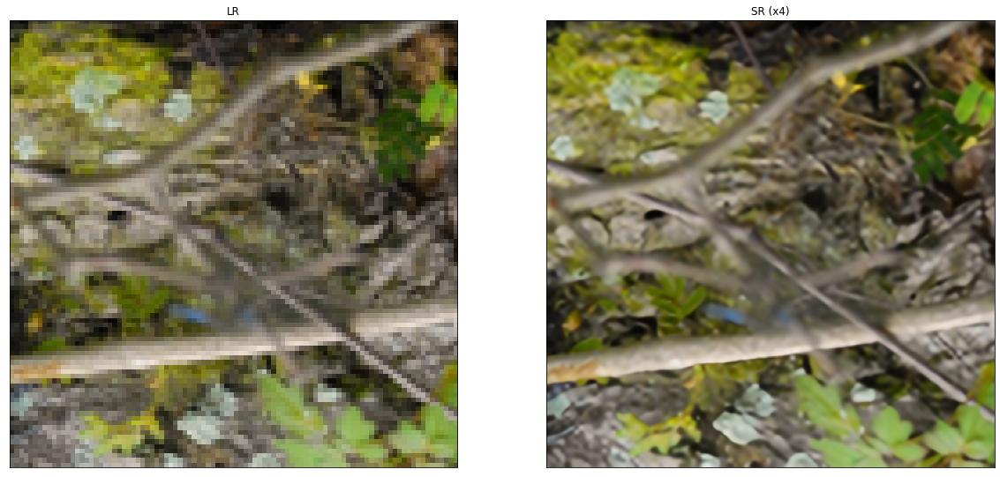

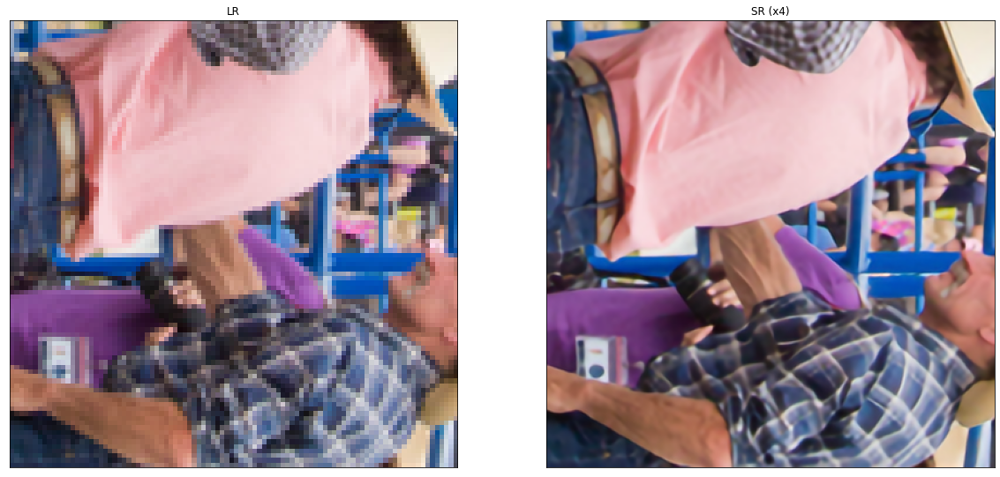

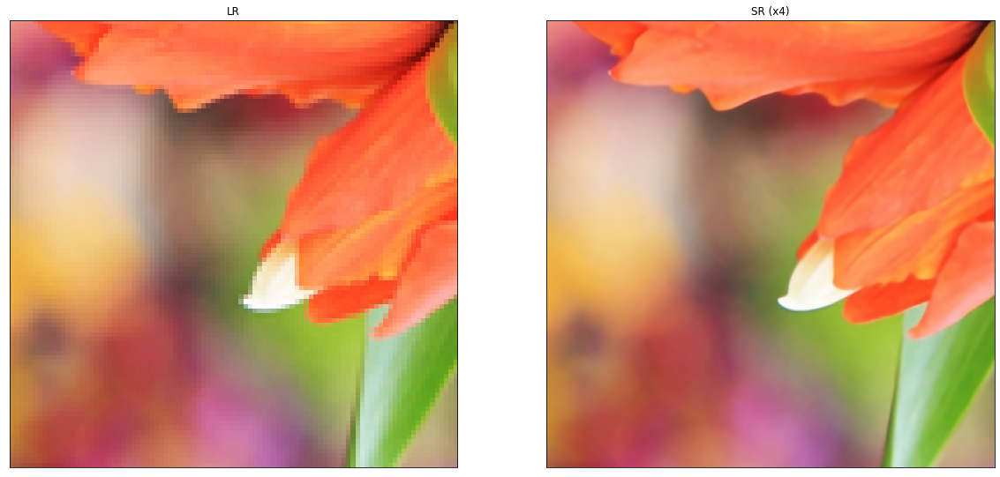

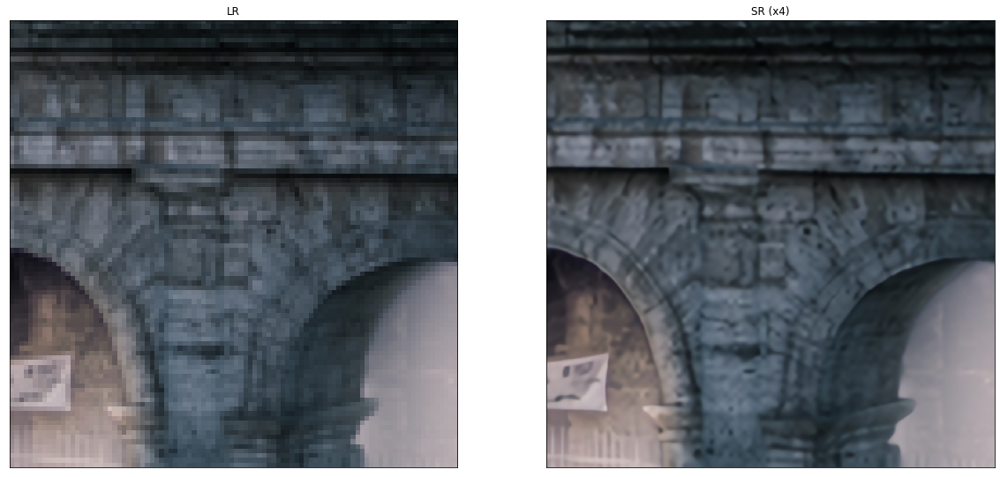

In [ ]:
for lr,hr in test_valid:
    sr = get_sr_image(model,lr)
    psnr = tf.image.psnr(hr,sr,max_val=255).numpy()
    ssim = tf.image.ssim(hr,sr,max_val=255).numpy()
    print('PSNR = {} and SSIM = {}'.format(psnr,ssim))
    plot_sample(lr[0],sr[0])

In [ ]:
def compute_psnr_ssim(lr,sr):
    LR = tf.image.resize(lr, size=(512,512))
    HR = tf.image.resize(sr, size=(512,512))
    #print(LR)
    LR = tf.clip_by_value(LR, 0, 255)
    HR = tf.clip_by_value(HR, 0, 255)
    # round up values
    LR = tf.round(LR)
    HR = tf.round(HR)
    # change dtype to unint8
    LR = tf.cast(LR, tf.uint8)
    HR = tf.cast(HR, tf.uint8)
    
    print('PSNR ==> {} and SSIM is ==> {}'.format(tf.image.psnr(LR,HR,max_val=255),
                                                  tf.image.ssim(LR,HR,max_val=255)))

###Summary
* I have trained EDSR model on Bicubic with scale 4 downgraded images with 300000 steps.
* After 300000 steps PSNR was around 29. So i have trained model for another 10000 steps and again 50000 steps.
* So i have trained EDSR model for total 360000 steps.
* I have used Adam optimizer with initial learning rate 0.0001 for first 200000 steps. After that learning rate decresed by half so from step 200000 to 300000 learning rate was 5e-5.
* from 300000 to 360000 learning rate decreased by half till 325000 and so on.
* Model has been evaluated at every 1000 steps with first 10 images of validation dataset.
* At every 1000 steps Average loss , Average PSNR and Average SSIM has been printed to observe model performance.
* Final Model gives PSNR = 28.88 on Full validation dataset .

# EDSR with DIV2K Unknown downgrading with scale 4

In [9]:
div2k = tfds.image.Div2k(config='unknown_x4')
div2k.download_and_prepare()

EXTRACTING {'train_lr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_unknown_X4.zip', 'valid_lr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_LR_unknown_X4.zip', 'train_hr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip', 'valid_hr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip'}


Shuffling and writing examples to /root/tensorflow_datasets/div2k/unknown_x4/2.0.0.incompleteST40EV/div2k-train.tfrecord


Shuffling and writing examples to /root/tensorflow_datasets/div2k/unknown_x4/2.0.0.incompleteST40EV/div2k-validation.tfrecord


Dataset div2k downloaded and prepared to /root/tensorflow_datasets/div2k/unknown_x4/2.0.0. Subsequent calls will reuse this data.


In [10]:
ds_train = div2k.as_dataset(split='train',as_supervised=True)
ds_valid = div2k.as_dataset(split='validation',as_supervised=True)

In [11]:
d_train = ds_train.cache()
d_valid = ds_valid.cache()

In [12]:
print('Train Cardinality of unknown_x4 is ==> ',d_train.cardinality().numpy())
print('Validation Cardinality of unknown_x4 is ==> ',d_valid.cardinality().numpy())

Train Cardinality of unknown_x4 is ==>  800
Validation Cardinality of unknown_x4 is ==>  100


# Plot LR and HR images from train dataset

LR Shape = (306, 510, 3) and HR Shape = (1224, 2040, 3)
LR Shape = (339, 510, 3) and HR Shape = (1356, 2040, 3)
LR Shape = (510, 291, 3) and HR Shape = (2040, 1164, 3)


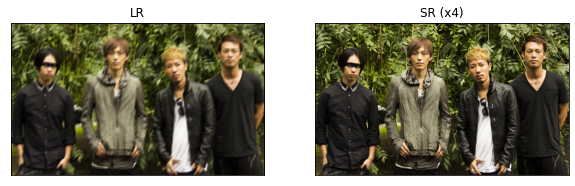

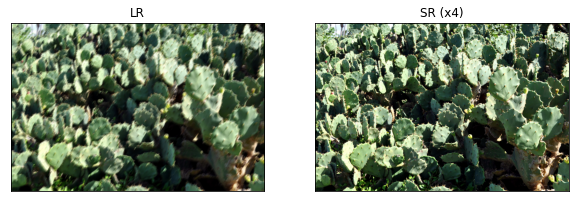

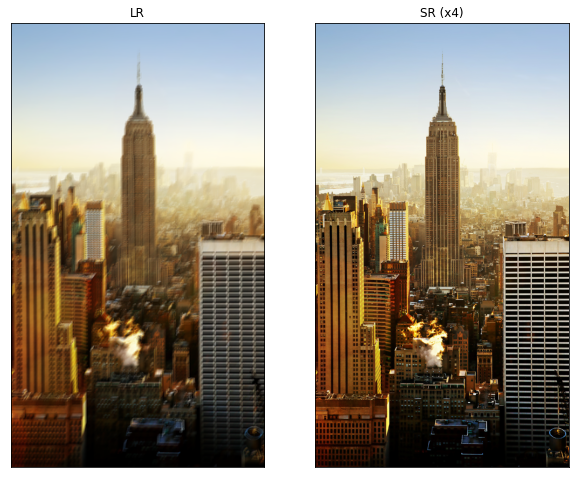

In [ ]:
for lr, hr in d_train.take(3):
    print('LR Shape = {} and HR Shape = {}'.format(lr.shape,hr.shape))
    plot_sample(lr,hr)

## Plot LR and HR images from validation dataset

LR Shape = (510, 417, 3) and HR Shape = (2040, 1668, 3)
LR Shape = (393, 510, 3) and HR Shape = (1572, 2040, 3)
LR Shape = (300, 510, 3) and HR Shape = (1200, 2040, 3)


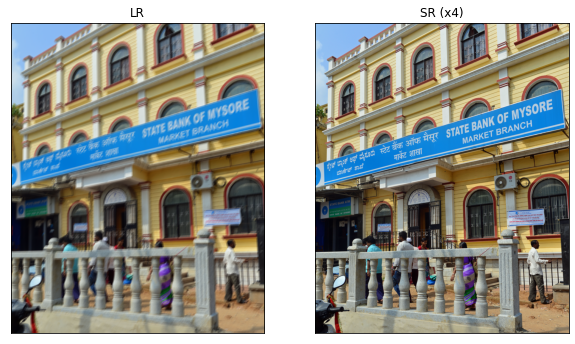

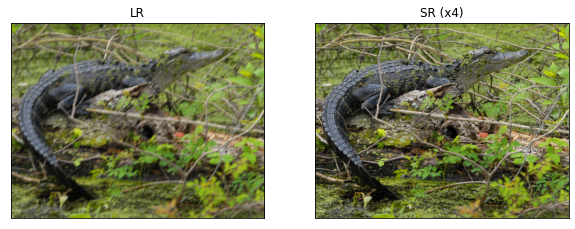

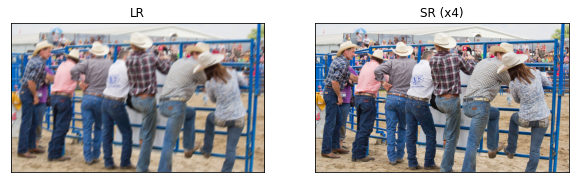

In [ ]:
for lr, hr in d_valid.take(3):
    print('LR Shape = {} and HR Shape = {}'.format(lr.shape,hr.shape))
    plot_sample(lr,hr)

# Preprocessing (Crop(192 X 192 from HR and 48 X 48 from LR) , Flip, Rotate)

In [15]:
def preprocessing(data, batch_size=16,scale=4,repeat_count=None,
                  crop_size=None,random_transform=True):
    # random transform will apply only on train dataset
    if random_transform:
        # random cropping
        data = data.map(lambda lr, hr:
                        random_crop(lr, hr, scale=scale,hr_crop_size=crop_size),
                        num_parallel_calls=AUTOTUNE)
        # random rotate
        data = data.map(random_rotate,num_parallel_calls=AUTOTUNE)
        # random flip
        data = data.map(random_flip,num_parallel_calls=AUTOTUNE)
    # ds.batch() will take images in given batch size
    data = data.batch(batch_size)
    # it will repeat dataset. if repeat_count() = None then infinite cardinality
    data = data.repeat(repeat_count)
    # ds.prefetch() will prefetch data for given buffer_size
    data = data.prefetch(buffer_size=AUTOTUNE)
    return data

In [16]:
train_preprocessed = preprocessing(d_train,crop_size=192)
valid_preprocessed = preprocessing(d_valid,batch_size=1,
                                   repeat_count=1,random_transform=False)

In [17]:
print('Train preprocesssed Cardinality of unknown_x4 is ==> ',
      train_preprocessed.cardinality().numpy())
print('Validation preprocessed Cardinality of unknown_x4 is ==> ',
      valid_preprocessed.cardinality().numpy())

Train preprocesssed Cardinality of unknown_x4 is ==>  -1
Validation preprocessed Cardinality of unknown_x4 is ==>  100


# Plot LR and HR images from preprocessed train data

LR Shape = (16, 48, 48, 3) and HR Shape = (16, 192, 192, 3)
LR Shape = (16, 48, 48, 3) and HR Shape = (16, 192, 192, 3)
LR Shape = (16, 48, 48, 3) and HR Shape = (16, 192, 192, 3)


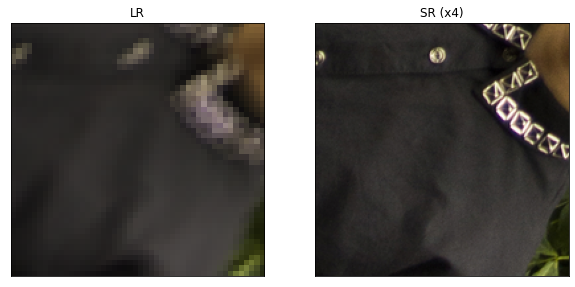

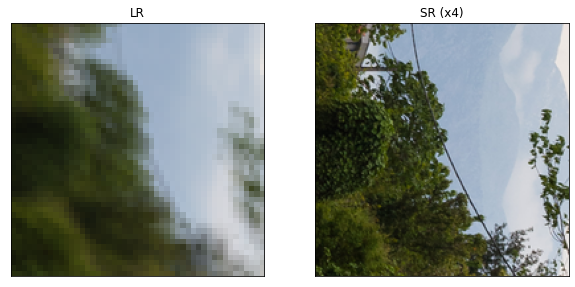

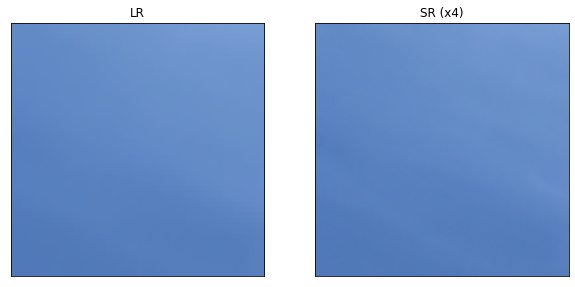

In [ ]:
for lr, hr in train_preprocessed.take(3):
    print('LR Shape = {} and HR Shape = {}'.format(lr.shape,hr.shape))
    plot_sample(lr[0],hr[0])

### EDSR Training on DIV2K Unknown_X4

In [ ]:
os.makedirs('checkpoint/edsr_unknown_x4',exist_ok=True)

In [ ]:
trainer = EdsrTraining(
    model=EDSR(scale=4, num_filters=64, res_blocks=16, res_block_scaling=None), 
    checkpoint_dir= f'checkpoint/edsr_unknown_x4')

In [ ]:
trainer.start_training(train_preprocessed,
              valid_preprocessed.take(10),
              steps=300000, 
              evaluate_every=1000, 
              save_best_only=True)

1000/300000: LOSS = 16.0033,PSNR = 22.170811, SSIM = 0.599307,Time = (157.65s)
2000/300000: LOSS = 13.0443,PSNR = 22.146423, SSIM = 0.614928,Time = (86.94s)
3000/300000: LOSS = 12.6374,PSNR = 22.653311, SSIM = 0.633228,Time = (86.58s)
4000/300000: LOSS = 12.2340,PSNR = 23.261957, SSIM = 0.655419,Time = (86.91s)
5000/300000: LOSS = 11.9536,PSNR = 23.273266, SSIM = 0.661562,Time = (86.41s)
6000/300000: LOSS = 11.5910,PSNR = 23.566523, SSIM = 0.672642,Time = (86.46s)
7000/300000: LOSS = 11.3998,PSNR = 23.670254, SSIM = 0.668368,Time = (86.38s)
8000/300000: LOSS = 11.2564,PSNR = 23.764744, SSIM = 0.682557,Time = (86.30s)
9000/300000: LOSS = 10.9698,PSNR = 23.852436, SSIM = 0.687010,Time = (86.25s)
10000/300000: LOSS = 10.8016,PSNR = 23.980873, SSIM = 0.685877,Time = (86.41s)
11000/300000: LOSS = 10.6608,PSNR = 24.106916, SSIM = 0.696756,Time = (86.38s)
12000/300000: LOSS = 10.4379,PSNR = 24.117702, SSIM = 0.700470,Time = (86.30s)
13000/300000: LOSS = 10.2182,PSNR = 25.068621, SSIM = 0.7284

In [23]:
trainer.restore()

Model restored from checkpoint at step 283000.


In [24]:
# evaluate on whole validationn dataset
validation_psnr = trainer.get_psnr(valid_preprocessed)
validation_ssim = trainer.get_ssim(valid_preprocessed)

In [26]:
print('Validatio PSNR is = {}'.format(validation_psnr))
print('Validation SSIM is = {}'.format(validation_ssim))

Validatio PSNR is = 27.802515029907227
Validation SSIM is = 0.78383469581604


In [32]:
trainer.model.save_weights('edsr_unknown_x4.h5')

In [13]:
model_unknown = EDSR(scale=4,res_blocks=16)
model_unknown.load_weights('edsr_unknown_x4.h5')

In [19]:
def plot_images(lr,sr,hr,figsize=(10,10)):
    plt.figure(figsize=figsize)

    images = [lr, sr, hr]
    titles = ['LR', f'SR (x{sr.shape[0] // lr.shape[0]})(predicted)', 'HR(Original)']

    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(1, 3, i+1)
        plt.imshow(img)
        plt.title(title)
        plt.xticks([])
        plt.yticks([])

PSNR = 25.4285831451416 and SSIM = 0.766749382019043
PSNR = 27.800203323364258 and SSIM = 0.8147346377372742
PSNR = 26.381990432739258 and SSIM = 0.7482569813728333
PSNR = 36.63115692138672 and SSIM = 0.9523704648017883


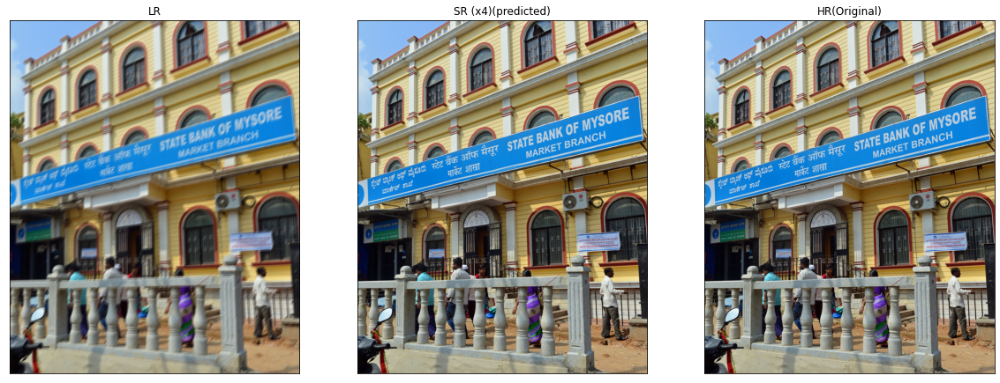

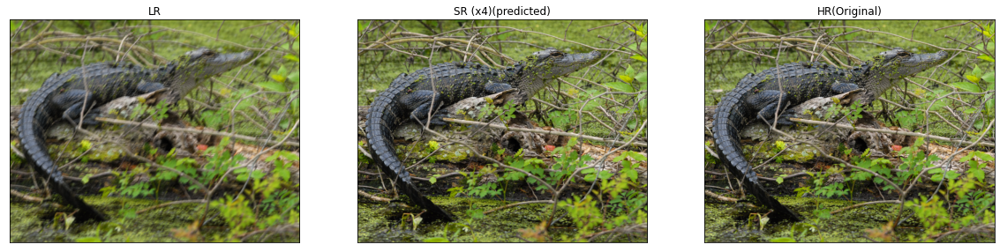

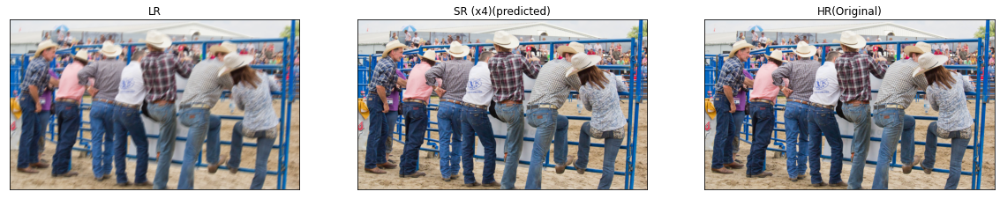

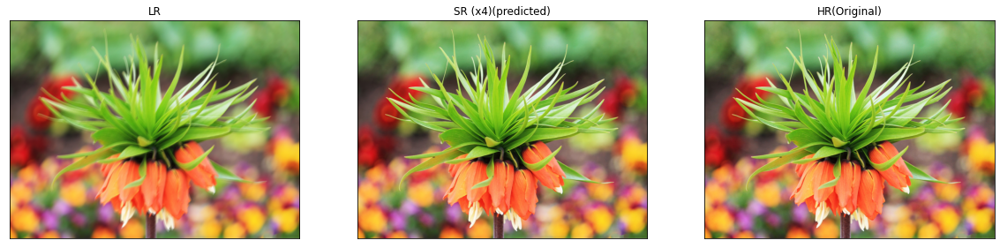

In [60]:
for lr,hr in valid_preprocessed.take(4):
    sr = get_sr_image(model_unknown,lr)
    psnr = tf.image.psnr(hr,sr,max_val=255).numpy()[0]
    ssim = tf.image.ssim(hr,sr,max_val=255).numpy()[0]
    print('PSNR = {} and SSIM = {}'.format(psnr,ssim))
    plot_images(lr[0],sr[0],hr[0],figsize=(20,20))

PSNR = 29.348907470703125 and SSIM = 0.8489503860473633
PSNR = 26.46957778930664 and SSIM = 0.8553317189216614
PSNR = 24.0107364654541 and SSIM = 0.7882029414176941
PSNR = 24.789113998413086 and SSIM = 0.6495579481124878
PSNR = 27.265241622924805 and SSIM = 0.7402963638305664


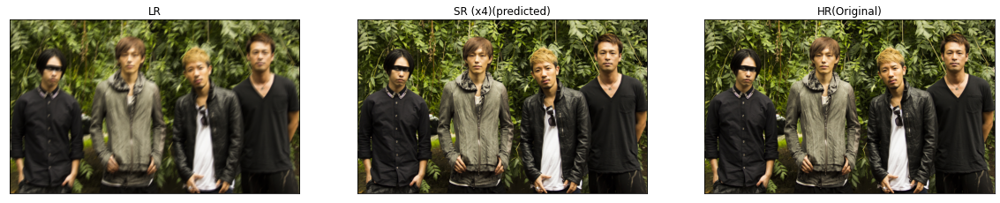

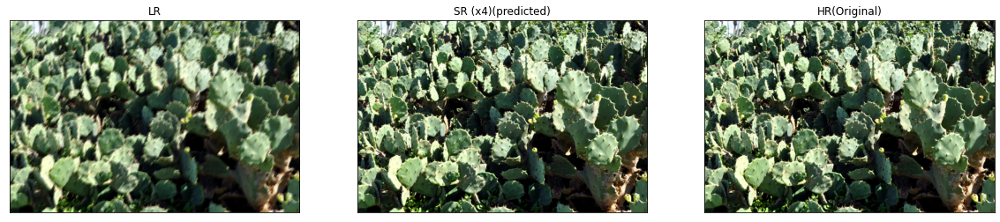

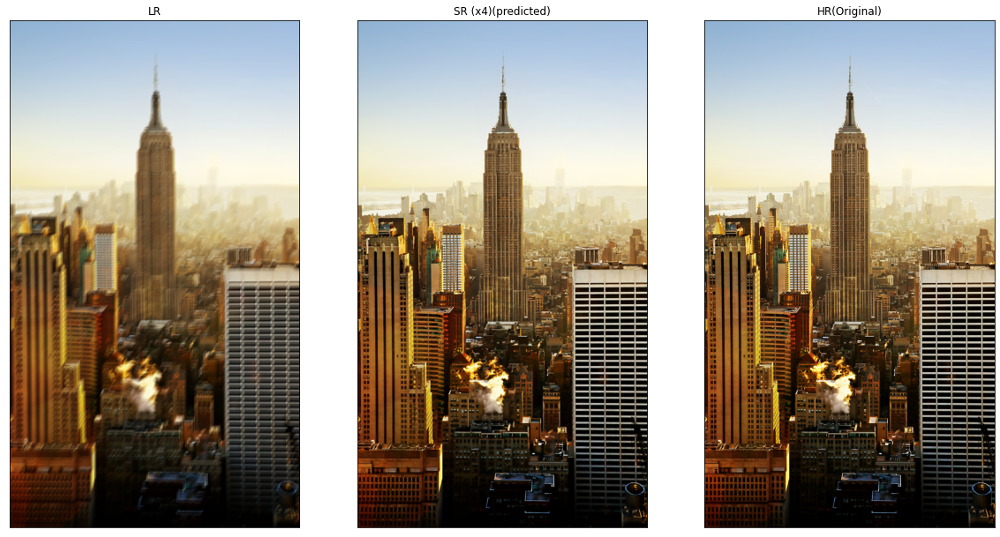

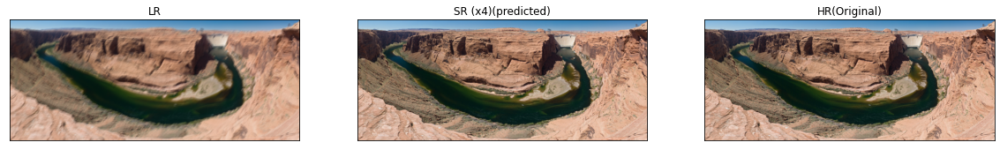

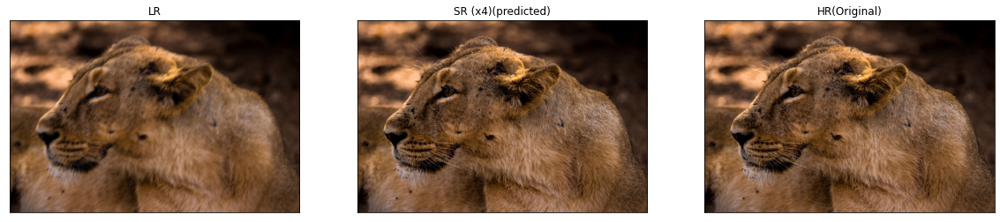

In [61]:
for lr,hr in d_train.take(5):
    sr = get_sr_image(model_unknown,lr)
    psnr = tf.image.psnr(hr,sr,max_val=255).numpy()[0]
    ssim = tf.image.ssim(hr,sr,max_val=255).numpy()[0]
    print('PSNR = {} and SSIM = {}'.format(psnr,ssim))
    plot_images(lr,sr[0],hr,figsize=(20,20))

In [89]:
lr = load_image('sumit_blur.jpg')
lr.shape

(729, 1093, 3)

In [92]:
#lr = lr[:,:,:3]
sr = get_sr_image(model_unknown,tf.expand_dims(lr,axis=0))
sr.shape

TensorShape([1, 2916, 4372, 3])

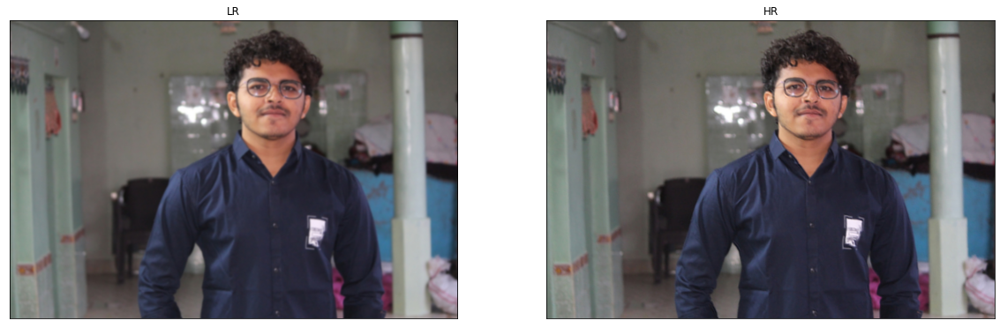

In [93]:
plot_sample(lr,sr[0],figsize=(20,20))